In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/extreme-weather-temperature-prediction/train_dataset.csv
/kaggle/input/extreme-weather-temperature-prediction/test_dataset.csv


# 1. Fetching and exploring data

In [2]:
df_train = pd.read_csv('/kaggle/input/extreme-weather-temperature-prediction/train_dataset.csv')
df_train.head()

,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,...,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax
0,30.3,21.1,61.741207,87.262192,26.629430,23.075077,4.263528,21.399026,0.297776,0.616711,...,0.000000,0.000000,0.000479,0.000000,37.5776,126.938,75.0924,1.7678,5131.667480,26.4
1,29.3,20.9,85.943954,97.694801,25.380395,23.275475,8.697955,53.165713,0.901123,0.867350,...,2.642577,0.261794,0.288428,2.315489,37.5507,126.988,132.1180,0.5931,5918.901367,25.6
2,29.5,22.2,32.008099,69.966370,31.991670,21.475995,10.461500,37.582673,0.012838,0.086090,...,0.000000,0.000000,0.000000,0.000000,37.5507,126.937,30.0464,0.8552,5222.419434,30.6
3,32.6,21.2,60.070614,91.244827,27.043616,23.338373,15.686361,95.842065,0.622580,0.388476,...,0.285723,0.335796,0.000000,0.000000,37.6046,127.032,44.7624,0.5141,5558.630371,27.2
4,33.0,27.6,62.508846,86.983963,31.529577,27.307177,6.493082,49.887497,0.438076,0.458994,...,0.000000,0.000000,0.000000,0.000000,37.5102,127.042,54.6384,0.1457,5635.460449,32.8


In [3]:
df_train.describe(include='all')

,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,...,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax
count,6528.000000,6528.000000,6524.000000,6524.000000,6524.000000,6524.000000,6524.000000,6524.000000,6524.000000,6524.000000,...,6524.000000,6524.000000,6524.000000,6524.000000,6589.000000,6589.000000,6589.000000,6589.000000,6589.000000,6567.000000
mean,29.767203,23.217862,56.733485,88.375947,29.618749,23.514294,7.078863,62.607915,0.368274,0.356035,...,0.578082,0.479413,0.280178,0.273615,37.544970,126.991331,62.042712,1.254981,5342.443957,30.284102
std,2.983094,2.429038,14.643501,7.201419,2.949113,2.345499,2.151549,33.846639,0.263172,0.258348,...,1.919926,1.745113,1.169598,1.230588,0.050402,0.079562,54.485681,1.368080,429.247389,3.132548
min,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000
25%,27.800000,21.600000,45.957097,84.224436,27.662062,22.100277,5.681878,37.253107,0.145684,0.138993,...,0.000000,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,5004.824219,28.200000
50%,29.900000,23.400000,55.017689,89.798084,29.697722,23.763636,6.540526,56.871052,0.314975,0.313254,...,0.000000,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5435.520020,30.500000
75%,32.000000,24.900000,67.205536,93.771591,31.729855,25.147837,7.990957,84.235666,0.574132,0.557710,...,0.049101,0.016580,0.007753,0.000000,37.577600,127.042000,59.832400,1.767800,5730.027832,32.700000
max,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,0.968353,...,23.701544,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000


In [4]:
df_train.isna().sum()

Present_Tmax        61
Present_Tmin        61
LDAPS_RHmin         65
LDAPS_RHmax         65
LDAPS_Tmax_lapse    65
LDAPS_Tmin_lapse    65
LDAPS_WS            65
LDAPS_LH            65
LDAPS_CC1           65
LDAPS_CC2           65
LDAPS_CC3           65
LDAPS_CC4           65
LDAPS_PPT1          65
LDAPS_PPT2          65
LDAPS_PPT3          65
LDAPS_PPT4          65
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           22
dtype: int64

In [5]:
df_train = df_train.dropna()
df_train.describe(include='all')

,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,...,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax
count,6450.000000,6450.000000,6450.000000,6450.000000,6450.000000,6450.000000,6450.000000,6450.000000,6450.000000,6450.000000,...,6450.000000,6450.000000,6450.000000,6450.000000,6450.000000,6450.000000,6450.000000,6450.000000,6450.000000,6450.000000
mean,29.746667,23.187550,56.705600,88.362649,29.625618,23.514271,7.075784,62.589980,0.368157,0.355623,...,0.579846,0.478753,0.278265,0.270904,37.545046,126.991339,62.097261,1.257948,5344.863722,30.249752
std,2.982832,2.419987,14.613635,7.217655,2.948545,2.344427,2.150767,33.860689,0.263064,0.258330,...,1.925088,1.743006,1.166224,1.216110,0.050493,0.079394,54.571199,1.370873,429.797520,3.118920
min,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000
25%,27.700000,21.600000,45.955848,84.207745,27.664085,22.099428,5.678962,37.187270,0.145547,0.138878,...,0.000000,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,5005.025513,28.200000
50%,29.900000,23.300000,55.012665,89.794765,29.709537,23.760914,6.540526,56.902232,0.315057,0.312948,...,0.000000,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5441.987305,30.500000
75%,32.000000,24.800000,67.154766,93.777760,31.730149,25.154676,7.986001,84.276653,0.573577,0.555757,...,0.049979,0.016374,0.007521,0.000000,37.577600,127.042000,59.832400,1.767800,5731.151367,32.600000
max,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,0.968353,...,23.701544,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000


In [6]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

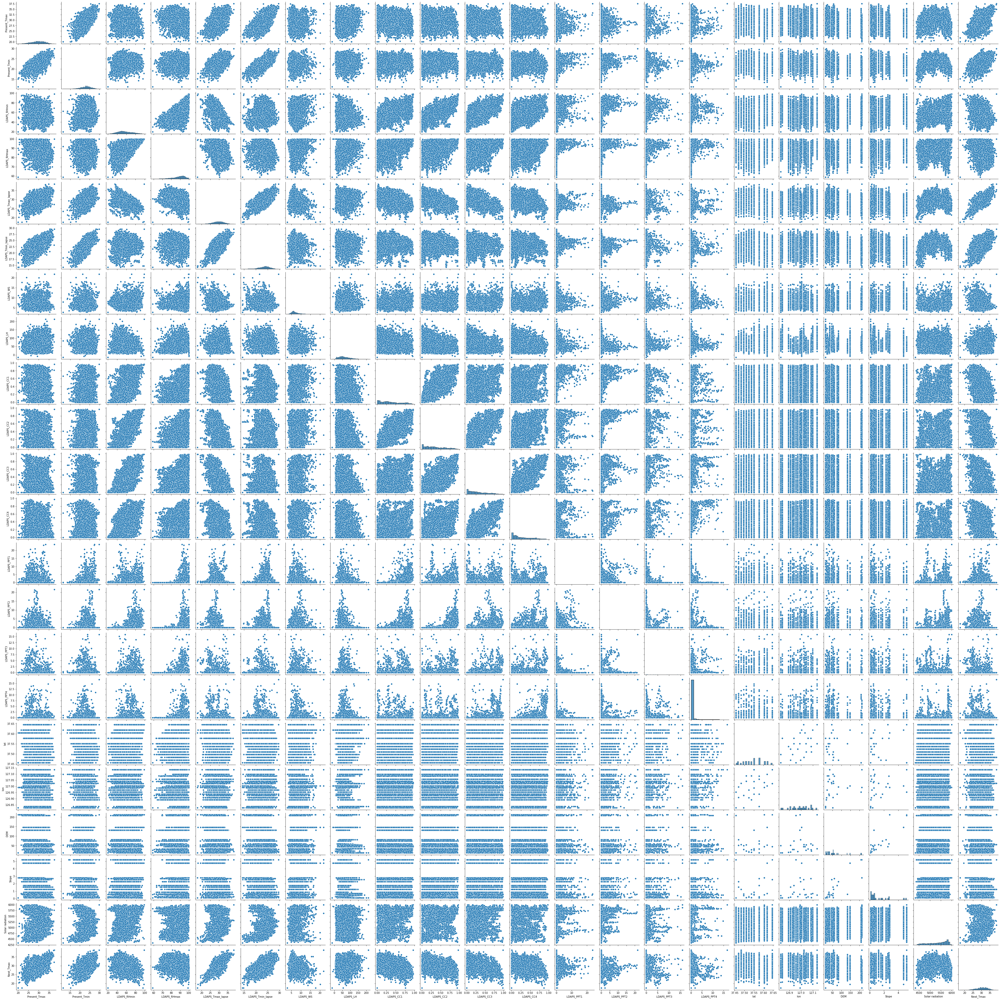

In [7]:
sns.pairplot(df_train)

<AxesSubplot:>

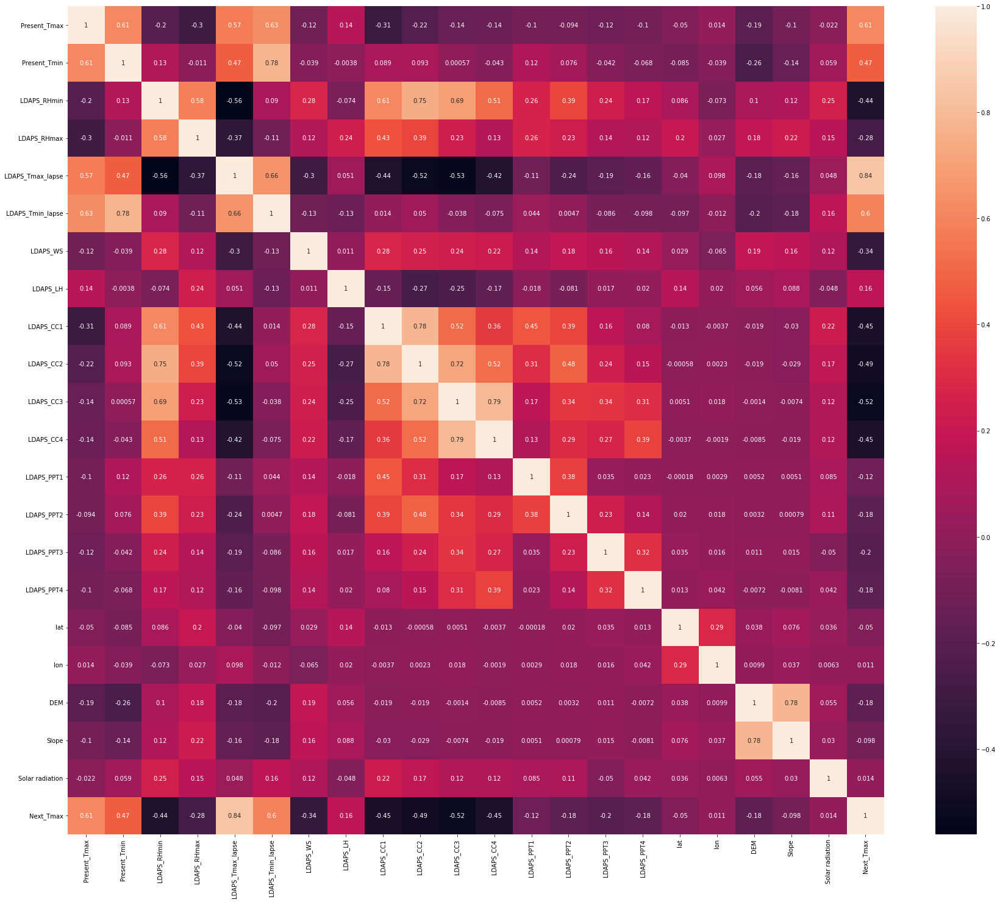

In [8]:
plt.figure(figsize=(30,25))
sns.heatmap(df_train.corr(), annot=True)

## There seems to be some degree of correlation between Next_Tmax with: Present Tmax, Present Tmin, LDAPS_RHmax, LDPAS_Tmin_lapse, LDPAS_WS, LDPAS_CC1, LDPAS_CC2, LDPAS_CC3, and LDPAS_CC4

# 2. Preparing data for machine learning

In [9]:
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.preprocessing import MinMaxScaler

In [10]:
X = df_train.drop('Next_Tmax', axis='columns')
y = df_train['Next_Tmax']

In [11]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=2023)

In [12]:
scaler = MinMaxScaler()

In [13]:
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# 3. Comparing different sklearn models in predicting next_Tmax

In [14]:
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.linear_model import LinearRegression, ElasticNet, SGDRegressor, BayesianRidge
from sklearn.svm import SVR
from catboost import CatBoostRegressor
from sklearn.kernel_ridge import KernelRidge
from xgboost.sklearn import XGBRegressor
from lightgbm import LGBMRegressor

In [15]:
models = {
    'GB Regressor': GradientBoostingRegressor(),
    'RF Regressor': RandomForestRegressor(),
    'Linear Regression': LinearRegression(),
    'ElasticNet': ElasticNet(),
    'SGD Regressor': SGDRegressor(),
    'Bayesian Ridge': BayesianRidge(),
    'SVR': SVR(),
    'CatBoost': CatBoostRegressor(),
    'Kernel Ridge': KernelRidge(),
    'XGBoost': XGBRegressor(),
    'LightGBM': LGBMRegressor()
}
models

{'GB Regressor': GradientBoostingRegressor(),
 'RF Regressor': RandomForestRegressor(),
 'Linear Regression': LinearRegression(),
 'ElasticNet': ElasticNet(),
 'SGD Regressor': SGDRegressor(),
 'Bayesian Ridge': BayesianRidge(),
 'SVR': SVR(),
 'CatBoost': <catboost.core.CatBoostRegressor at 0x7f8c08cb6210>,
 'Kernel Ridge': KernelRidge(),
 'XGBoost': XGBRegressor(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, gamma=None,
              gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=100, n_jobs=None,
              num_parallel_tree

In [16]:
model_names = []
model_mse_mean = []
for model_name, model in models.items():
    mses = cross_val_score(model, X_train_scaled, y_train, scoring='neg_mean_squared_error')
    model_names.append(model_name)
    model_mse_mean.append(-mses.mean())

Learning rate set to 0.051223
0:	learn: 3.0289469	total: 56.7ms	remaining: 56.6s
1:	learn: 2.9321415	total: 60.4ms	remaining: 30.1s
2:	learn: 2.8392778	total: 65.3ms	remaining: 21.7s
3:	learn: 2.7521380	total: 70.5ms	remaining: 17.5s
4:	learn: 2.6741966	total: 75ms	remaining: 14.9s
5:	learn: 2.5950237	total: 77.3ms	remaining: 12.8s
6:	learn: 2.5252166	total: 79.6ms	remaining: 11.3s
7:	learn: 2.4576544	total: 81.9ms	remaining: 10.2s
8:	learn: 2.3914033	total: 84.3ms	remaining: 9.29s
9:	learn: 2.3277634	total: 86.6ms	remaining: 8.58s
10:	learn: 2.2679089	total: 89.1ms	remaining: 8.01s
11:	learn: 2.2166273	total: 91.5ms	remaining: 7.53s
12:	learn: 2.1667444	total: 93.9ms	remaining: 7.13s
13:	learn: 2.1185932	total: 96.1ms	remaining: 6.77s
14:	learn: 2.0746457	total: 98.5ms	remaining: 6.47s
15:	learn: 2.0318297	total: 101ms	remaining: 6.21s
16:	learn: 1.9921483	total: 103ms	remaining: 5.97s
17:	learn: 1.9550138	total: 106ms	remaining: 5.76s
18:	learn: 1.9201570	total: 108ms	remaining: 5.57

In [17]:
model_comparison = pd.DataFrame()
model_comparison['model'] = model_names
model_comparison['mean mse'] = model_mse_mean
model_comparison

,model,mean mse
0,GB Regressor,1.462767
1,RF Regressor,1.093369
2,Linear Regression,2.106681
3,ElasticNet,9.827230
4,SGD Regressor,2.168812
5,Bayesian Ridge,2.106734
6,SVR,1.768891
7,CatBoost,0.641130
8,Kernel Ridge,6.177207
9,XGBoost,0.907004


## CatBoost Regressor has the lowest MSE

# 4. Model parameter tuning

In [18]:
model_optimizer = GridSearchCV(CatBoostRegressor(), {
    'depth': [6,8,10],
    'learning_rate': [0.01, 0.05, 0.1],
    'iterations': [50,100,150]
}, scoring='neg_mean_squared_error')

In [19]:
model_optimizer.fit(X_train_scaled, y_train)

0:	learn: 3.1139812	total: 3.02ms	remaining: 148ms
1:	learn: 3.0945227	total: 5.51ms	remaining: 132ms
2:	learn: 3.0745160	total: 7.95ms	remaining: 124ms
3:	learn: 3.0547058	total: 10.6ms	remaining: 122ms
4:	learn: 3.0362722	total: 13.2ms	remaining: 119ms
5:	learn: 3.0172056	total: 15.9ms	remaining: 117ms
6:	learn: 2.9988580	total: 18.6ms	remaining: 114ms
7:	learn: 2.9802858	total: 21.3ms	remaining: 112ms
8:	learn: 2.9612358	total: 23.9ms	remaining: 109ms
9:	learn: 2.9418427	total: 26.4ms	remaining: 106ms
10:	learn: 2.9231368	total: 29.2ms	remaining: 103ms
11:	learn: 2.9055063	total: 31.9ms	remaining: 101ms
12:	learn: 2.8876654	total: 34.5ms	remaining: 98.1ms
13:	learn: 2.8698049	total: 37.1ms	remaining: 95.4ms
14:	learn: 2.8526621	total: 39.7ms	remaining: 92.5ms
15:	learn: 2.8351547	total: 42.3ms	remaining: 89.8ms
16:	learn: 2.8174529	total: 44.8ms	remaining: 87ms
17:	learn: 2.8010284	total: 47.2ms	remaining: 84ms
18:	learn: 2.7839617	total: 49.8ms	remaining: 81.2ms
19:	learn: 2.766810

GridSearchCV(estimator=<catboost.core.CatBoostRegressor object at 0x7f8c08039650>,
             param_grid={'depth': [6, 8, 10], 'iterations': [50, 100, 150],
                         'learning_rate': [0.01, 0.05, 0.1]},
             scoring='neg_mean_squared_error')

In [20]:
optimizer_results = pd.DataFrame(model_optimizer.cv_results_)
optimizer_results[['param_depth', 'param_learning_rate', 'param_iterations', 'mean_test_score']]

,param_depth,param_learning_rate,param_iterations,mean_test_score
0,6,0.01,50,-5.556613
1,6,0.05,50,-2.113516
2,6,0.1,50,-1.605484
3,6,0.01,100,-3.696484
4,6,0.05,100,-1.606176
5,6,0.1,100,-1.228902
6,6,0.01,150,-2.830622
7,6,0.05,150,-1.377181
8,6,0.1,150,-1.004596
9,8,0.01,50,-5.465654


## It seems that the parameter tuning yielded worse results as compared to default setting. Therefore default model will be used without any hyperparameter tuning

# 5. Training and testing final model

In [21]:
final_model = CatBoostRegressor()

In [22]:
final_model.fit(X_train_scaled, y_train)

Learning rate set to 0.053061
0:	learn: 3.0272796	total: 2.97ms	remaining: 2.97s
1:	learn: 2.9267635	total: 5.76ms	remaining: 2.87s
2:	learn: 2.8289279	total: 8.62ms	remaining: 2.87s
3:	learn: 2.7375324	total: 11.4ms	remaining: 2.84s
4:	learn: 2.6552701	total: 14.2ms	remaining: 2.82s
5:	learn: 2.5751233	total: 17ms	remaining: 2.82s
6:	learn: 2.4993235	total: 19.8ms	remaining: 2.8s
7:	learn: 2.4308606	total: 22.4ms	remaining: 2.78s
8:	learn: 2.3641252	total: 25.2ms	remaining: 2.78s
9:	learn: 2.3001617	total: 28ms	remaining: 2.77s
10:	learn: 2.2397524	total: 30.8ms	remaining: 2.77s
11:	learn: 2.1851238	total: 33.5ms	remaining: 2.76s
12:	learn: 2.1340393	total: 36.3ms	remaining: 2.76s
13:	learn: 2.0862478	total: 39.1ms	remaining: 2.75s
14:	learn: 2.0396301	total: 42.7ms	remaining: 2.8s
15:	learn: 1.9981703	total: 45.7ms	remaining: 2.81s
16:	learn: 1.9598391	total: 48.5ms	remaining: 2.81s
17:	learn: 1.9211920	total: 51.5ms	remaining: 2.81s
18:	learn: 1.8858603	total: 54.2ms	remaining: 2.8s

In [23]:
final_model.score(X_test_scaled, y_test)

0.9279294646369146

## R2 value seems good

In [24]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
from scipy.stats import spearmanr

In [25]:
y_predicted = final_model.predict(X_test_scaled)

In [26]:
mse = mean_squared_error(y_test, y_predicted)
mae = mean_absolute_error(y_test, y_predicted)
correlation = spearmanr(y_test, y_predicted)
print(f'MSE = {mse:.4f}, MAE = {mae:.4f}, Correlation = {correlation.correlation:.4f}, P-value of correlation = {correlation.pvalue:.4f}')

MSE = 0.6725, MAE = 0.6047, Correlation = 0.9631, P-value of correlation = 0.0000


# 6. Predicting and saving Tmax for test_dataset

In [27]:
df_test = pd.read_csv('/kaggle/input/extreme-weather-temperature-prediction/test_dataset.csv')
df_test.head()

,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,...,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,34.0,25.3,59.441780,87.809990,33.679278,27.864485,6.237572,82.372333,0.358150,0.462551,...,0.127188,0.000000,0.0,0.056192,0.001105,37.4697,126.995,82.2912,2.2579,5269.604980
1,34.9,25.8,42.140888,87.437630,36.318381,28.056302,6.672544,73.152947,0.089003,0.058192,...,0.020227,0.000000,0.0,0.000000,0.000000,37.5372,127.085,28.7000,0.6233,5071.220215
2,27.0,21.4,61.607719,82.623398,28.937996,22.920885,7.756562,60.288615,0.445716,0.252695,...,0.279000,0.020203,0.0,0.000000,0.000000,37.5372,126.891,15.5876,0.1554,4954.847656
3,33.1,27.1,50.549240,73.318398,33.253016,27.820149,5.626367,10.999599,0.196958,0.290637,...,0.603896,0.000000,0.0,0.000000,0.000000,37.5507,127.040,26.2980,0.5721,4865.184082
4,27.9,23.0,48.714233,90.838814,31.012719,24.287468,8.163316,33.094886,0.294709,0.101219,...,0.103166,0.000000,0.0,0.000000,0.000000,37.5507,126.988,132.1180,0.5931,5377.179199


In [28]:
X_unknown = scaler.transform(df_test)
X_unknown

array([[0.79545455, 0.75268817, 0.50358287, ..., 0.34966719, 0.42510133,
        0.55557182],
       [0.84659091, 0.77956989, 0.28383339, ..., 0.08166429, 0.10331258,
        0.43367375],
       [0.39772727, 0.54301075, 0.53109383, ..., 0.01609082, 0.01120138,
        0.36216831],
       ...,
       [0.74431818, 0.75806452, 0.39453016, ..., 0.11335984, 0.08012237,
        0.42421424],
       [0.68181818, 0.68817204, 0.3371609 , ..., 0.08166429, 0.10331258,
        0.50699495],
       [0.68181818, 0.83333333, 0.55940697, ..., 0.08839747, 0.14896461,
        0.77853028]])

In [29]:
y_predicted = final_model.predict(X_unknown)

In [30]:
df_prediction = df_test
df_prediction['predicted Next T_max'] = y_predicted
df_prediction.head()

,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,...,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,predicted Next T_max
0,34.0,25.3,59.441780,87.809990,33.679278,27.864485,6.237572,82.372333,0.358150,0.462551,...,0.000000,0.0,0.056192,0.001105,37.4697,126.995,82.2912,2.2579,5269.604980,33.030595
1,34.9,25.8,42.140888,87.437630,36.318381,28.056302,6.672544,73.152947,0.089003,0.058192,...,0.000000,0.0,0.000000,0.000000,37.5372,127.085,28.7000,0.6233,5071.220215,35.761715
2,27.0,21.4,61.607719,82.623398,28.937996,22.920885,7.756562,60.288615,0.445716,0.252695,...,0.020203,0.0,0.000000,0.000000,37.5372,126.891,15.5876,0.1554,4954.847656,29.472039
3,33.1,27.1,50.549240,73.318398,33.253016,27.820149,5.626367,10.999599,0.196958,0.290637,...,0.000000,0.0,0.000000,0.000000,37.5507,127.040,26.2980,0.5721,4865.184082,32.782669
4,27.9,23.0,48.714233,90.838814,31.012719,24.287468,8.163316,33.094886,0.294709,0.101219,...,0.000000,0.0,0.000000,0.000000,37.5507,126.988,132.1180,0.5931,5377.179199,31.062697


In [31]:
df_prediction.to_csv('prediction_dataset.csv', index=False)